# 1. Exploratory Data Analysis (EDA)

This notebook analyzes:
1. Class distribution and balance
2. Audio duration statistics
3. Spectrogram visualization
4. Feature statistics per class
5. Artist distribution across classes

In [34]:
# Imports
import sys
sys.path.insert(0, '..')

from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Audio, display

from src import config
from src.data_utils import load_manifest
from src.audio_utils import load_audio, extract_log_mel, normalize_mel

# Plot settings
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 12

In [35]:
# Load manifest
manifest = load_manifest()
print(f"Total samples: {len(manifest)}")
manifest.head()

Total samples: 2517


,track_id,artist_id,album_id,duration,label,label_idx,tags_raw,split,filepath
0,track_1283297,artist_416786,album_153040,294.0,house,0,genre---dance;genre---house,train,C:\Users\adria\Desktop\zum_project\data\audio\...
1,track_1371096,artist_490499,album_160413,181.1,house,0,genre---dance;genre---electronic;genre---house,train,C:\Users\adria\Desktop\zum_project\data\audio\...
2,track_0986496,artist_428046,album_116107,352.2,house,0,genre---dance;genre---electronic;genre---funk;...,train,C:\Users\adria\Desktop\zum_project\data\audio\...
3,track_0210595,artist_004820,album_031129,419.0,house,0,genre---easylistening;genre---electronic;genre...,train,C:\Users\adria\Desktop\zum_project\data\audio\...
4,track_1115569,artist_441841,album_133279,464.8,house,0,genre---deephouse;genre---electronic;genre---h...,train,C:\Users\adria\Desktop\zum_project\data\audio\...


## 1. Class Distribution

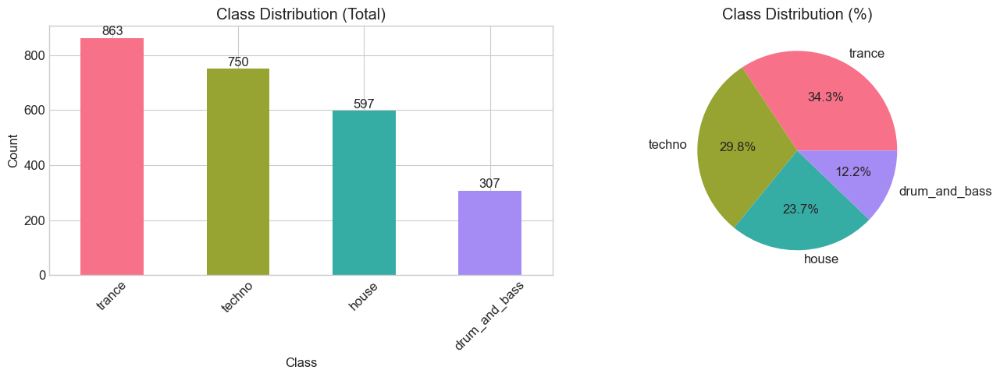

In [36]:
# Overall class distribution
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Bar plot
class_counts = manifest['label'].value_counts()
colors = sns.color_palette('husl', len(config.TARGET_CLASSES))
class_counts.plot(kind='bar', ax=axes[0], color=colors)
axes[0].set_title('Class Distribution (Total)')
axes[0].set_xlabel('Class')
axes[0].set_ylabel('Count')
axes[0].tick_params(axis='x', rotation=45)

# Add count labels
for i, v in enumerate(class_counts):
    axes[0].text(i, v + 10, str(v), ha='center')

# Pie chart
axes[1].pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', colors=colors)
axes[1].set_title('Class Distribution (%)')

plt.tight_layout()
plt.savefig(config.RESULTS_DIR / 'eda_class_distribution.png', dpi=150)
plt.show()

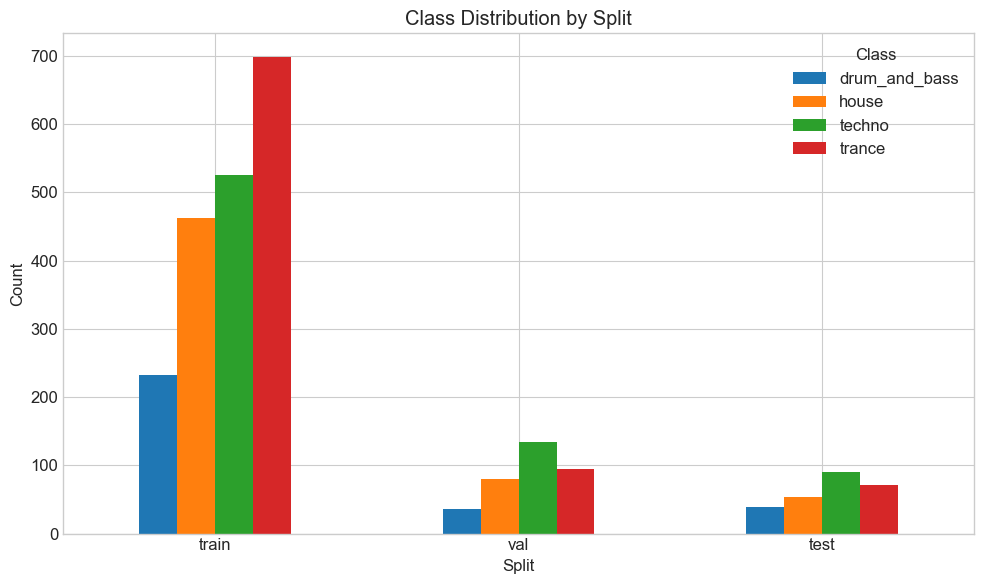


Class counts by split:
label  drum_and_bass  house  techno  trance
split                                      
train            232    463     526     698
val               36     80     134      94
test              39     54      90      71


In [37]:
# Class distribution by split
split_class = manifest.groupby(['split', 'label']).size().unstack(fill_value=0)
split_class = split_class.reindex(['train', 'val', 'test'])

fig, ax = plt.subplots(figsize=(10, 6))
split_class.plot(kind='bar', ax=ax)
ax.set_title('Class Distribution by Split')
ax.set_xlabel('Split')
ax.set_ylabel('Count')
ax.legend(title='Class')
ax.tick_params(axis='x', rotation=0)

plt.tight_layout()
plt.savefig(config.RESULTS_DIR / 'eda_class_by_split.png', dpi=150)
plt.show()

print("\nClass counts by split:")
print(split_class)

## 2. Audio Duration Statistics

Duration statistics (seconds):
count    2517.000000
mean      288.362336
std       124.360226
min        30.100000
25%       219.000000
50%       275.200000
75%       345.700000
max      2071.800000
Name: duration, dtype: float64


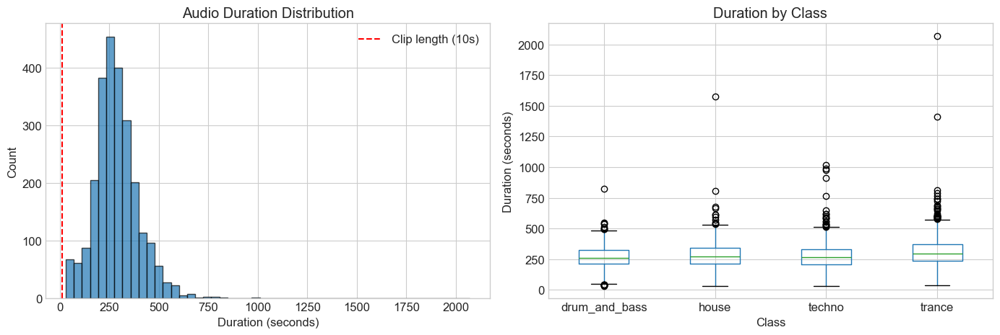

In [38]:
# Duration statistics
print("Duration statistics (seconds):")
print(manifest['duration'].describe())

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram
manifest['duration'].hist(bins=50, ax=axes[0], edgecolor='black', alpha=0.7)
axes[0].axvline(x=config.CLIP_DURATION_SEC, color='r', linestyle='--', label=f'Clip length ({config.CLIP_DURATION_SEC}s)')
axes[0].set_title('Audio Duration Distribution')
axes[0].set_xlabel('Duration (seconds)')
axes[0].set_ylabel('Count')
axes[0].legend()

# Box plot by class
manifest.boxplot(column='duration', by='label', ax=axes[1])
axes[1].set_title('Duration by Class')
axes[1].set_xlabel('Class')
axes[1].set_ylabel('Duration (seconds)')
plt.suptitle('')

plt.tight_layout()
plt.savefig(config.RESULTS_DIR / 'eda_duration.png', dpi=150)
plt.show()

In [39]:
# Tracks shorter than clip duration
short_tracks = manifest[manifest['duration'] < config.CLIP_DURATION_SEC]
print(f"\nTracks shorter than {config.CLIP_DURATION_SEC}s: {len(short_tracks)} ({100*len(short_tracks)/len(manifest):.1f}%)")
print("These will be zero-padded during preprocessing.")


Tracks shorter than 10s: 0 (0.0%)
These will be zero-padded during preprocessing.


## 3. Spectrogram Visualization

c:\Users\adria\Desktop\zum_project\notebooks\..\src\audio_utils.py:48: UserWarning: torchaudio failed for C:\Users\adria\Desktop\zum_project\data\audio\717743.mp3, trying pydub: TorchCodec is required for load_with_torchcodec. Please install torchcodec to use this function.
  warnings.warn(f"torchaudio failed for {path}, trying pydub: {e}")
c:\Users\adria\Desktop\zum_project\venv\Lib\site-packages\pydub\utils.py:198: RuntimeWarning: Couldn't find ffprobe or avprobe - defaulting to ffprobe, but may not work
  warn("Couldn't find ffprobe or avprobe - defaulting to ffprobe, but may not work", RuntimeWarning)
c:\Users\adria\Desktop\zum_project\notebooks\..\src\audio_utils.py:48: UserWarning: torchaudio failed for C:\Users\adria\Desktop\zum_project\data\audio\1341169.mp3, trying pydub: TorchCodec is required for load_with_torchcodec. Please install torchcodec to use this function.
  warnings.warn(f"torchaudio failed for {path}, trying pydub: {e}")
c:\Users\adria\Desktop\zum_project\notebook

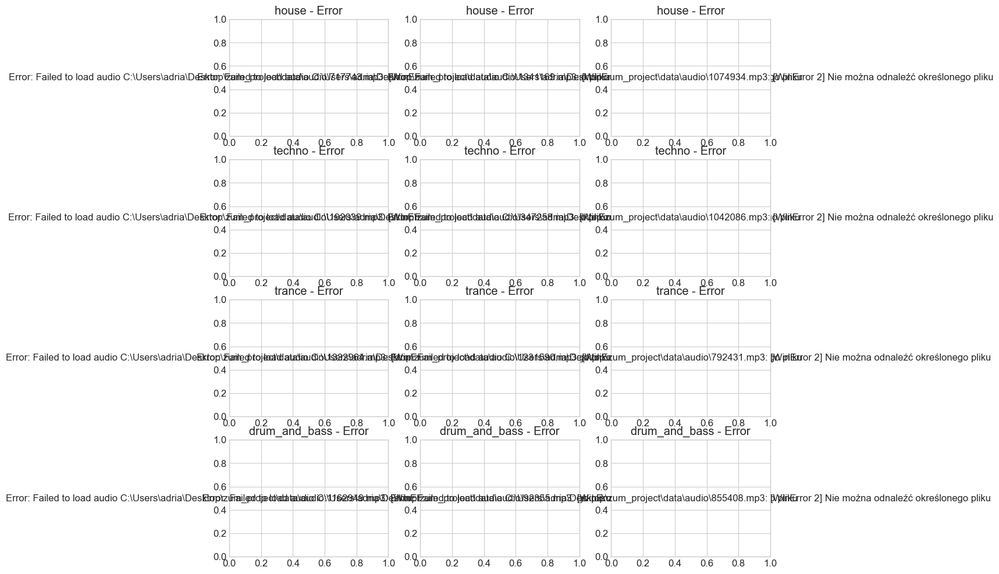

In [40]:
def plot_spectrogram_samples(manifest, n_per_class=2):
    """Plot sample spectrograms for each class."""
    fig, axes = plt.subplots(len(config.TARGET_CLASSES), n_per_class, 
                             figsize=(4*n_per_class, 3*len(config.TARGET_CLASSES)))
    
    for i, label in enumerate(config.TARGET_CLASSES):
        samples = manifest[manifest['label'] == label].sample(n_per_class, random_state=42)
        
        for j, (_, row) in enumerate(samples.iterrows()):
            try:
                # Load and process audio
                waveform, sr = load_audio(row['filepath'])
                mel = extract_log_mel(waveform, sr)
                mel = mel.squeeze().numpy()
                
                # Plot
                ax = axes[i, j] if n_per_class > 1 else axes[i]
                im = ax.imshow(mel, aspect='auto', origin='lower', cmap='magma')
                ax.set_title(f'{label} (track {row["track_id"].split("_")[-1]})')
                ax.set_ylabel('Mel bin')
                ax.set_xlabel('Time frame')
                
            except Exception as e:
                ax = axes[i, j] if n_per_class > 1 else axes[i]
                ax.text(0.5, 0.5, f'Error: {e}', ha='center', va='center')
                ax.set_title(f'{label} - Error')
    
    plt.tight_layout()
    plt.savefig(config.RESULTS_DIR / 'eda_spectrograms.png', dpi=150)
    plt.show()

# Plot spectrograms
plot_spectrogram_samples(manifest, n_per_class=3)

## 4. Audio Samples

Listen to sample tracks from each class.

In [41]:
# Play sample audio from each class
for label in config.TARGET_CLASSES:
    sample = manifest[manifest['label'] == label].sample(1, random_state=42).iloc[0]
    print(f"\n{'='*40}")
    print(f"Class: {label}")
    print(f"Track ID: {sample['track_id']}")
    print(f"Duration: {sample['duration']:.1f}s")
    
    try:
        display(Audio(filename=sample['filepath']))
    except Exception as e:
        print(f"Could not play audio: {e}")


Class: house
Track ID: track_0717743
Duration: 181.2s



Class: techno
Track ID: track_0192039
Duration: 159.7s



Class: trance
Track ID: track_1332964
Duration: 267.4s



Class: drum_and_bass
Track ID: track_1162949
Duration: 212.6s


## 5. Artist Distribution

In [42]:
# Artists per class
artists_per_class = manifest.groupby('label')['artist_id'].nunique()
print("Unique artists per class:")
print(artists_per_class)

# Tracks per artist distribution
tracks_per_artist = manifest.groupby('artist_id').size()
print(f"\nTracks per artist statistics:")
print(tracks_per_artist.describe())

Unique artists per class:
label
drum_and_bass     88
house            167
techno           191
trance           163
Name: artist_id, dtype: int64

Tracks per artist statistics:
count    456.000000
mean       5.519737
std        8.891510
min        1.000000
25%        1.000000
50%        2.000000
75%        6.250000
max       99.000000
dtype: float64


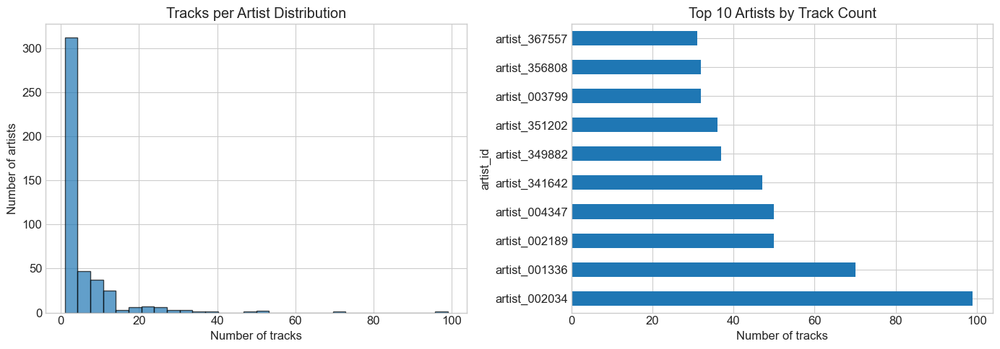

In [43]:
# Top artists by track count
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Distribution
tracks_per_artist.hist(bins=30, ax=axes[0], edgecolor='black', alpha=0.7)
axes[0].set_title('Tracks per Artist Distribution')
axes[0].set_xlabel('Number of tracks')
axes[0].set_ylabel('Number of artists')

# Top 10 artists
top_artists = tracks_per_artist.nlargest(10)
top_artists.plot(kind='barh', ax=axes[1])
axes[1].set_title('Top 10 Artists by Track Count')
axes[1].set_xlabel('Number of tracks')

plt.tight_layout()
plt.savefig(config.RESULTS_DIR / 'eda_artists.png', dpi=150)
plt.show()

## 6. Summary Statistics

In [44]:
# Summary
print("="*60)
print("EDA SUMMARY")
print("="*60)
print(f"\nTotal samples: {len(manifest)}")
print(f"Total artists: {manifest['artist_id'].nunique()}")
print(f"\nClass distribution:")
for label in config.TARGET_CLASSES:
    count = len(manifest[manifest['label'] == label])
    pct = 100 * count / len(manifest)
    print(f"  {label}: {count} ({pct:.1f}%)")

print(f"\nSplit distribution:")
for split in ['train', 'val', 'test']:
    count = len(manifest[manifest['split'] == split])
    pct = 100 * count / len(manifest)
    print(f"  {split}: {count} ({pct:.1f}%)")

print(f"\nAudio specifications:")
print(f"  Target sample rate: {config.SAMPLE_RATE} Hz")
print(f"  Clip duration: {config.CLIP_DURATION_SEC} s")
print(f"  Mel bins: {config.N_MELS}")
print(f"  FFT size: {config.N_FFT}")
print(f"  Hop length: {config.HOP_LENGTH}")

time_frames = config.CLIP_SAMPLES // config.HOP_LENGTH + 1
print(f"  Expected spectrogram shape: ({config.N_MELS}, {time_frames})")
print("="*60)

EDA SUMMARY

Total samples: 2517
Total artists: 456

Class distribution:
  house: 597 (23.7%)
  techno: 750 (29.8%)
  trance: 863 (34.3%)
  drum_and_bass: 307 (12.2%)

Split distribution:
  train: 1919 (76.2%)
  val: 344 (13.7%)
  test: 254 (10.1%)

Audio specifications:
  Target sample rate: 22050 Hz
  Clip duration: 10 s
  Mel bins: 128
  FFT size: 1024
  Hop length: 256
  Expected spectrogram shape: (128, 862)
